# Concentration weighted (CWT) plots inc figureS10

Reads in full years worth of data and generates the CWT arrays, saves them. Also, loads the arrays that were made for the manuscript 

***Figure S10:*** Subplots

In [1]:
import sys

sys.path.append(r'C:\Users\DominicHeslinRees\Documents\ACP_2023\scripts\HYSPLIT_plotting')
import HYSPLIT_plotting as HYplot

sys.path.append(r'C:\Users\DominicHeslinRees\Documents\ACP_2023\scripts\HYSPLIT-processing')
import HYSPLIT_processing as HYprocess

sys.path.append(r'C:\Users\DominicHeslinRees\Documents\ACP_2023\scripts\Trends')
import trends_functions as fu_trends

sys.path.append(r'C:\Users\DominicHeslinRees\Documents\ACP_2023\scripts\clustering_HYSPLIT')
import clustering_functions as fu_cluster

%load_ext autoreload
%autoreload 2

import pandas as pd
import cmocean

In [2]:
savepath_plot = r'C:\Users\DominicHeslinRees\Documents\ACP_2023\plots'

# Check memory, delete if necessary: 

In [3]:
for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),
                         key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, HYplot.sizeof_fmt(size)))

               NamespaceMagics:  896.0 B
                           _ii:  645.0 B
                           _i1:  645.0 B
                           _i3:  259.0 B
                           _oh:  232.0 B
                           Out:  232.0 B
                   get_ipython:  136.0 B
                    _getsizeof:  136.0 B
                   _getshapeof:  136.0 B
                  var_dic_list:  136.0 B


# Load data: 

In [3]:
loadpath = r'C:\Users\DominicHeslinRees\Documents\ACP_2023\Analysis'

df_abs637 = fu_trends.load_df(loadpath+'\\absorption\\appended',                   
                       filename='oldpsap_newpsap_maap',)
df_era5_GDAS = fu_trends.load_df(loadpath+'\\ERA5_rainfall',                   
                       filename='era5_GDAS_2002_2023')

df_abs637_rain = pd.merge(df_abs637, df_era5_GDAS, left_index=True, right_index=True)

df_abs637_rain = fu_trends.prepare_data(df_abs637_rain)

loading: C:\Users\DominicHeslinRees\Documents\ACP_2023\Analysis\absorption\appended\oldpsap_newpsap_maap.dat
loading: C:\Users\DominicHeslinRees\Documents\ACP_2023\Analysis\ERA5_rainfall\era5_GDAS_2002_2023.dat
start date inserted: 2002-03-08
start year: 2002
end year: 2023
number years: 21
first season: AHZ
Note: the slow build-up season crosses over two years as it goes from October-January, so the year corresponds to previous year
Number of unique seasons: 62
full_season_to_season_num given


# Example using processed datasets: 

In [4]:
inpath_processed_hysplit_dfs="D:\\HYSPLIT\\processed\\"

Matching files from observational data & HYSPLIT: 81
file: F:\HYSPLIT\processed\2002\20020308_14.pickle
file: F:\HYSPLIT\processed\2002\20020308_15.pickle
file: F:\HYSPLIT\processed\2002\20020308_16.pickle
file: F:\HYSPLIT\processed\2002\20020308_17.pickle
file: F:\HYSPLIT\processed\2002\20020308_18.pickle
file: F:\HYSPLIT\processed\2002\20020308_19.pickle
file: F:\HYSPLIT\processed\2002\20020308_20.pickle
file: F:\HYSPLIT\processed\2002\20020308_21.pickle
file: F:\HYSPLIT\processed\2002\20020308_22.pickle
file: F:\HYSPLIT\processed\2002\20020308_23.pickle
file: F:\HYSPLIT\processed\2002\20020309_00.pickle
file: F:\HYSPLIT\processed\2002\20020309_01.pickle
file: F:\HYSPLIT\processed\2002\20020309_02.pickle
file: F:\HYSPLIT\processed\2002\20020309_03.pickle
file: F:\HYSPLIT\processed\2002\20020309_04.pickle
file: F:\HYSPLIT\processed\2002\20020309_05.pickle
file: F:\HYSPLIT\processed\2002\20020309_06.pickle
file: F:\HYSPLIT\processed\2002\20020309_07.pickle
file: F:\HYSPLIT\processed\20

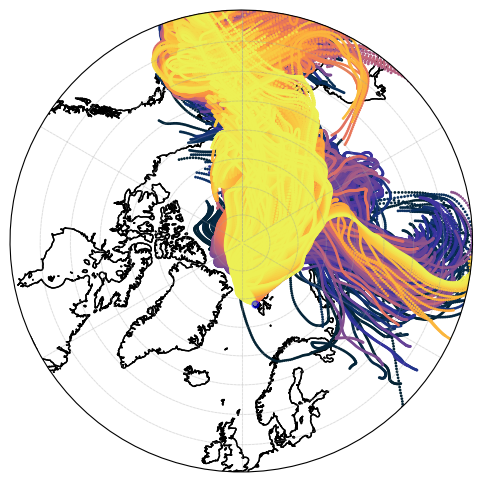

In [6]:
time_range = list(pd.date_range('2002-03-08 14:00:00', '2002-03-11 22:00:00', freq='H')) #using time range
#convert the datetimes to HYSPLIT names
HYSPLIT_names_obs = HYplot.create_HYSPLIT_name_from_list(time_range) #for whole period
#list all the preprocessed HYSPLIT files - ones actually have preprocessed
list_of_HYSPLIT_files = HYplot.list_files(year=2002, 
                                          inpath_processed_hysplit_dfs=inpath_processed_hysplit_dfs)
#match the files with the datetimes interested
matching_list_of_back_traj_files = HYplot.find_matching_files(list_of_HYSPLIT_files, HYSPLIT_names_obs)
#read in the matching files 
trajs_dictionary = HYplot.create_traj_dictionary_using_matching_files(matching_list_of_back_traj_files, 
                                                                      select_for_mixed_layer=False)
fig = HYplot.circular_traj_plots(trajs_dictionary)

# Processing & saving: 

In [7]:
HYplot.save_processed_trajs_with_obs(df_abs637, outpath_summed_dfs=inpath_processed_hysplit_dfs+"abs\\dfs\\", 
                              inpath_processed_hysplit_dfs=inpath_processed_hysplit_dfs,
                              var='abs637', process=True,  
                              years=[2019])

Year: 2019
Matching files from observational data & HYSPLIT: 0
not weekly resolution
variable: abs637
no files to concat
None


# Load dfs and create arrays: 

# Contribution wieghted trajectorys:

Need the residence time array for each trajectory, the concentration at the receptor for each trajectory, and the total residence time array. 


## Multuply concentration by residence times: 

create a dictionary linking the grid to the residence time for that particular trajectrory and have it as an additional column i.e. residence time for traj (the one that correponds to the concentration)

Find the total residence times (for entire dataset)
Divide C*tij by total residence times: 

# Single year (CWT): 

In [5]:
inpath_processed_hysplit_dfs = 'D:\\HYSPLIT\\processed\\'
savepath = 'C:\\Users\\DominicHeslinRees\\Documents\\ACP_2023\\Analysis\\'

In [5]:
years = np.arange(2022, 2023, 1)
year_arrays_CWT = HYplot.save_append_CWT_arrays(years, path=inpath_processed_hysplit_dfs, folder='abs',
                                            savepath=savepath+"abs\\arrays\\",
                                            select_for_mixed_layer=True, data_format='.pickle', var='obs',
                                            usecols=['Traj_num', 'grid_lat', 'grid_lon', 'obs', 'arrival_time', 'MIXDEPTH','altitude'])

F:\HYSPLIT\processed\abs\dfs\
F:\HYSPLIT\processed\abs\dfs\\2022*.pickle
no years provided, just a year
['F:\\HYSPLIT\\processed\\abs\\dfs\\2022.pickle']
F:\HYSPLIT\processed\abs\dfs\2022.pickle
['Traj_num', 'grid_lat', 'grid_lon', 'obs', 'arrival_time', 'MIXDEPTH', 'altitude']
Length before: 55347476
Length after: 52933973
['Traj_num', 'grid_lon', 'grid_lat', 'obs']
altitude of air mass below mixed layer height
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12683930 entries, 2022-01-01 00:00:00 to 2022-07-24 17:00:00
Data columns (total 5 columns):
 #   Column        Dtype  
---  ------        -----  
 0   Traj_num      int8   
 1   grid_lat      int8   
 2   grid_lon      int16  
 3   obs           float16
 4   arrival_time  object 
dtypes: float16(1), int16(1), int8(2), object(1)
memory usage: 1.1 GB
size of df: 12683930
threshold: None
32400
mean: 0.17190041592016578
median: 0.10517248946629214
mean after threshold applied: 0.17190041592016578
median after threshold applied: 

## load arrays: 

In [6]:
years = np.arange(2002, 2024, 1)
year_arrays_CWT = HYplot.load_year_arrays(years, path=inpath_processed_hysplit_dfs+"abs\\arrays\\")

2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023


# Plots

## year by year

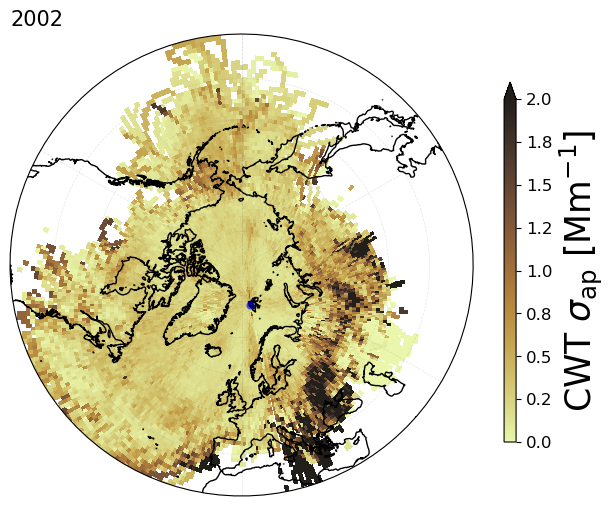

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2002.png


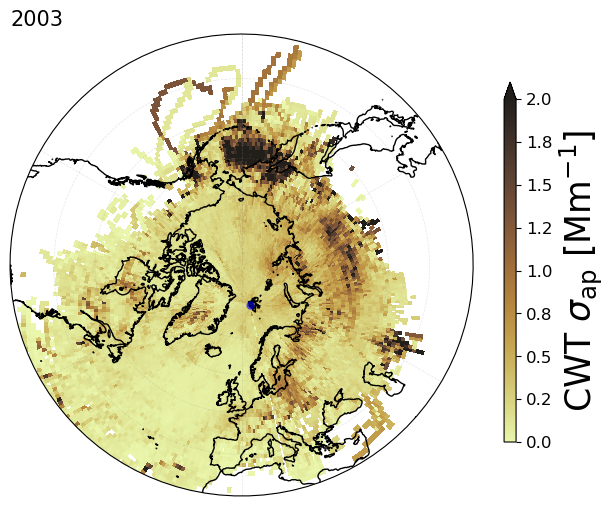

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2003.png


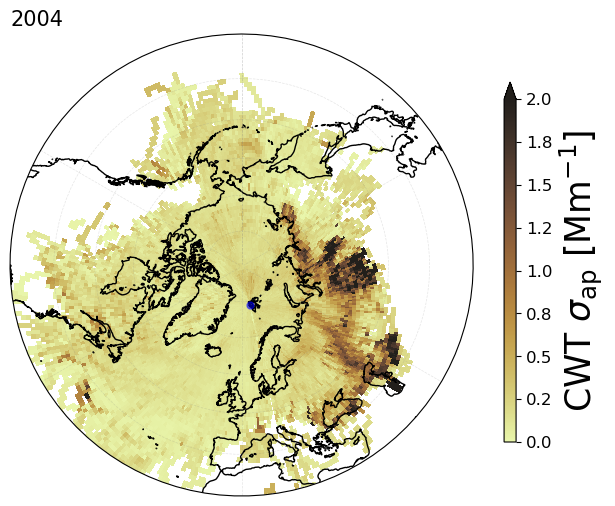

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2004.png


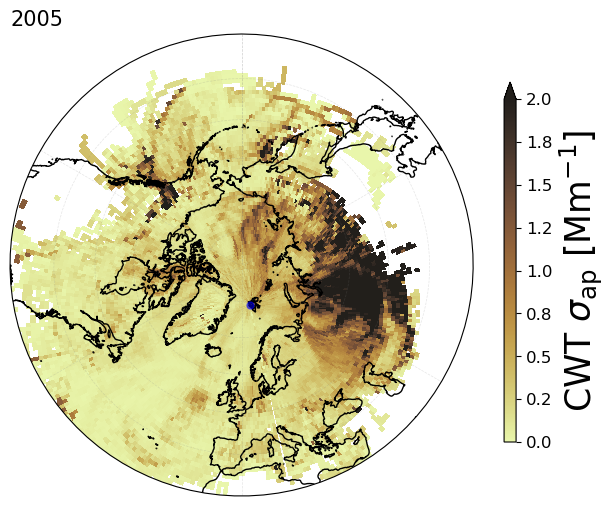

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2005.png


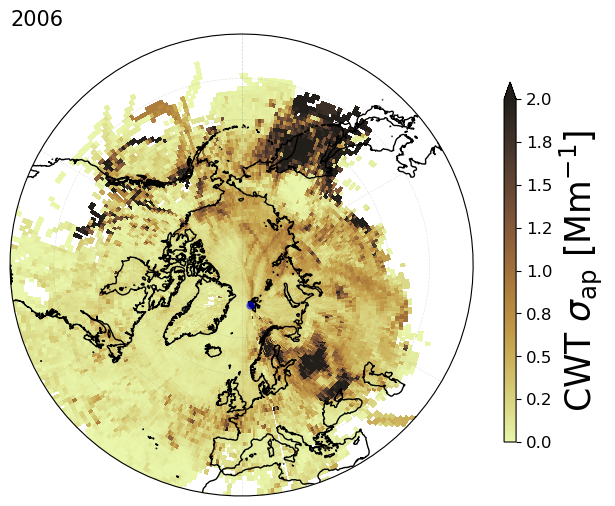

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2006.png


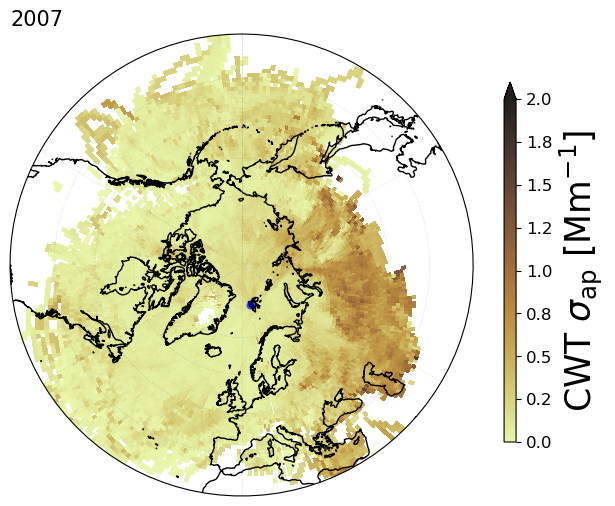

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2007.png


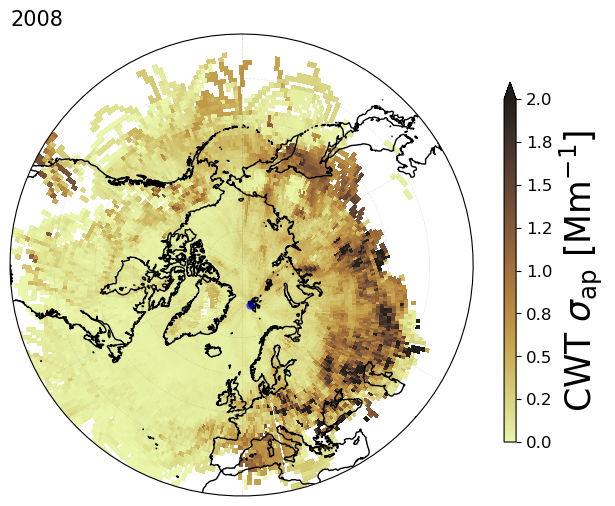

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2008.png


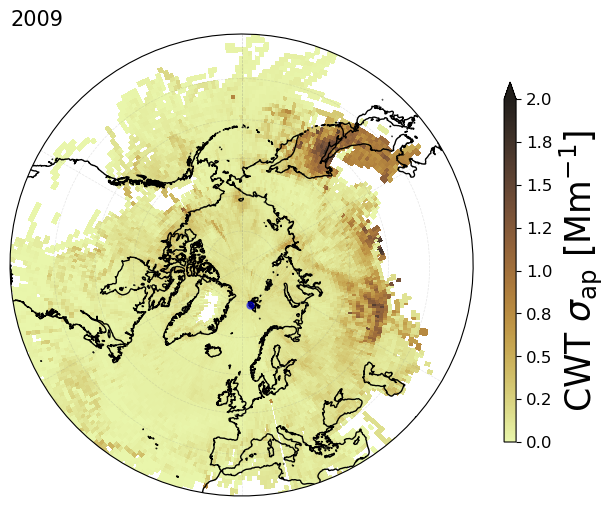

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2009.png


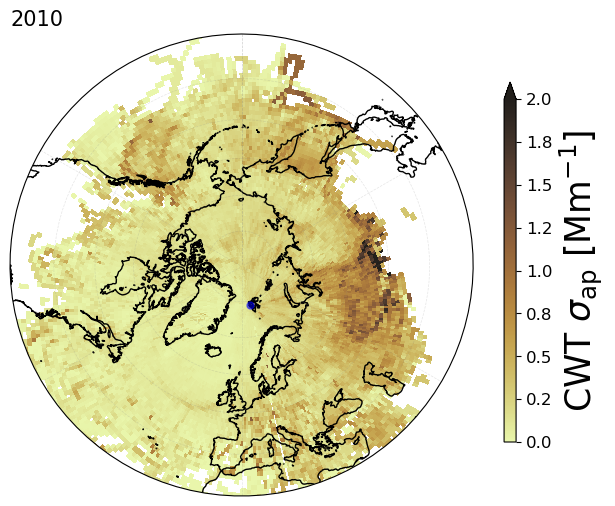

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2010.png


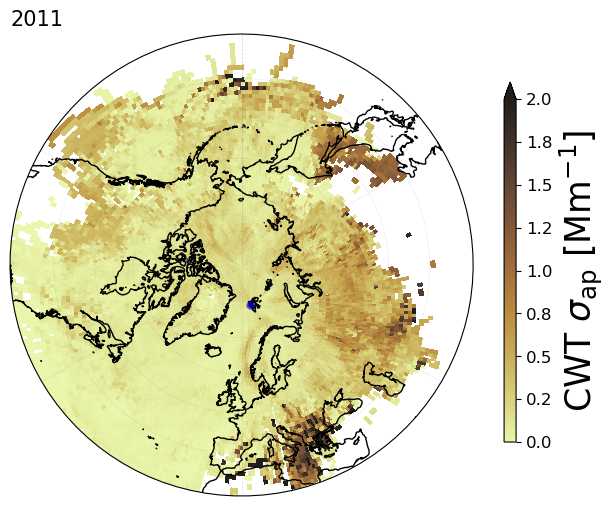

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2011.png


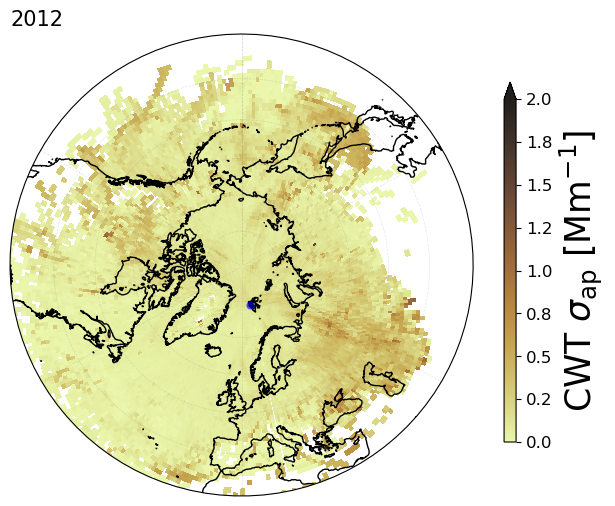

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2012.png


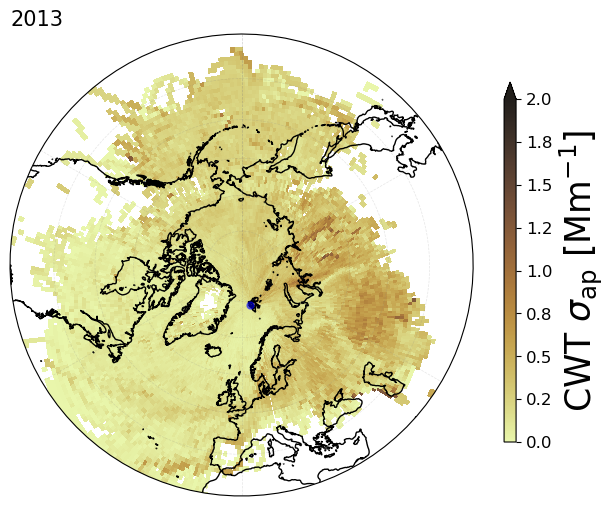

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2013.png


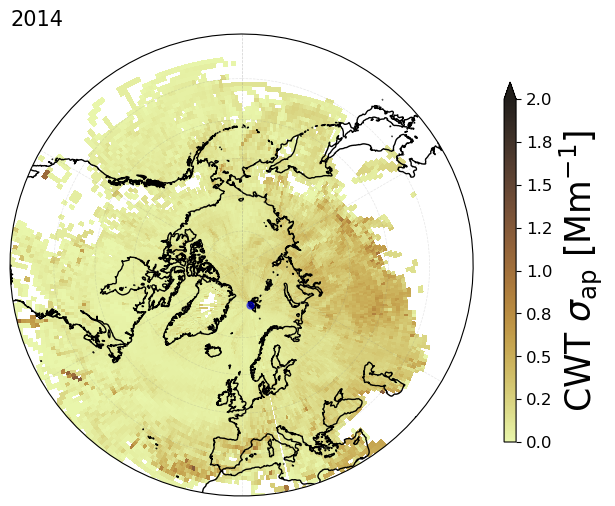

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2014.png


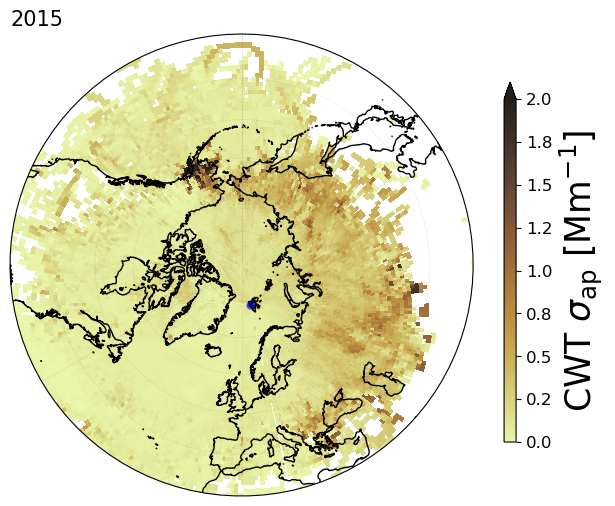

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2015.png


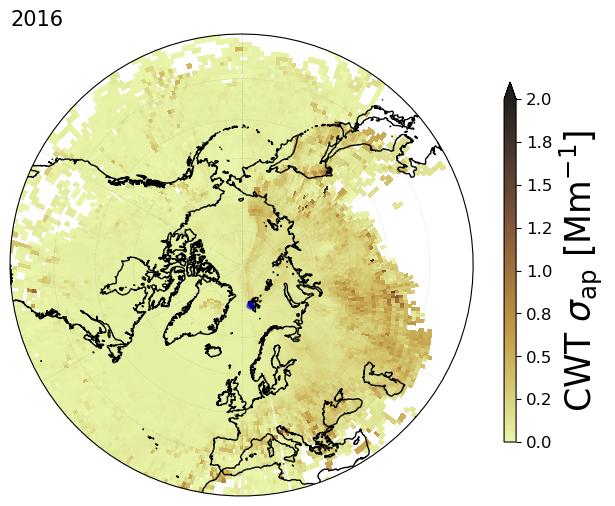

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2016.png


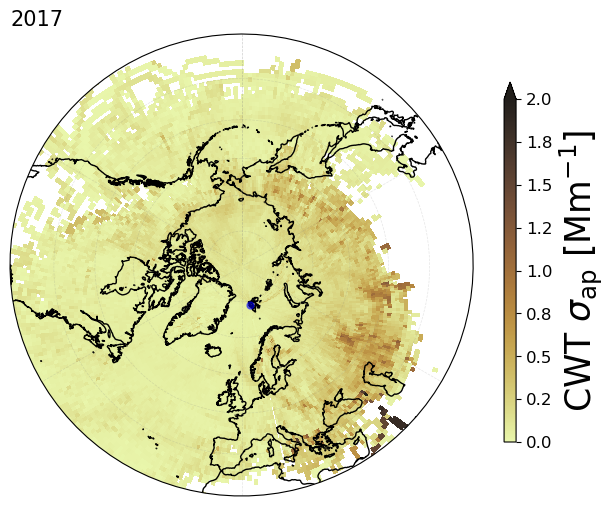

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2017.png


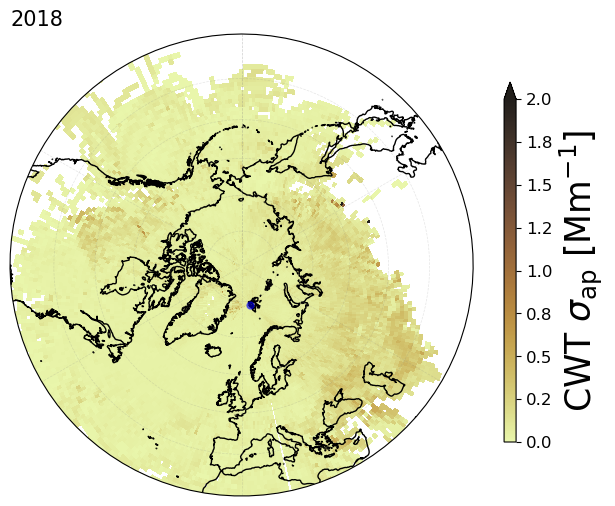

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2018.png


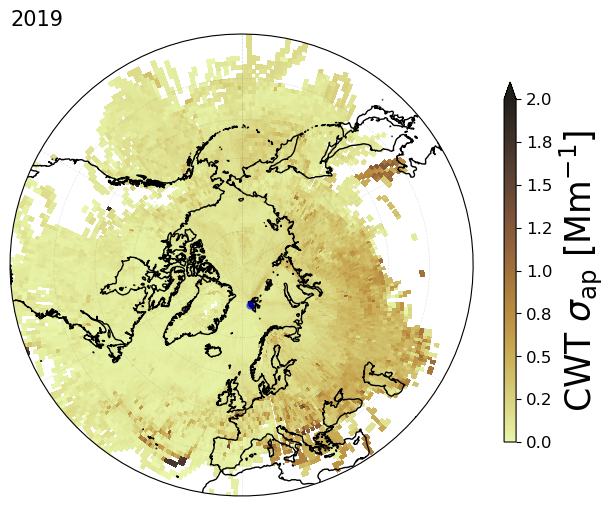

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2019.png


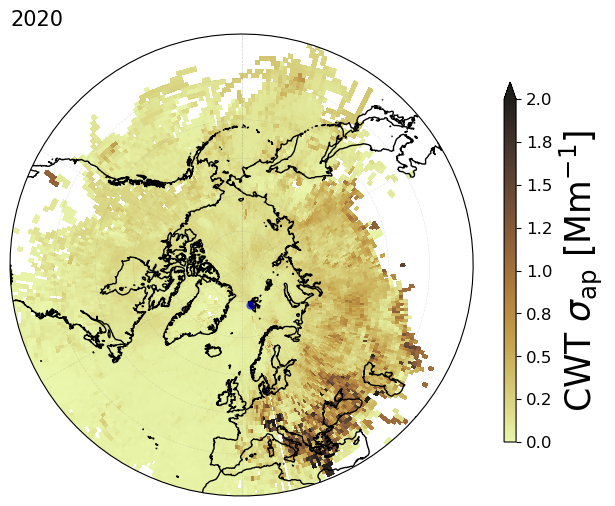

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2020.png


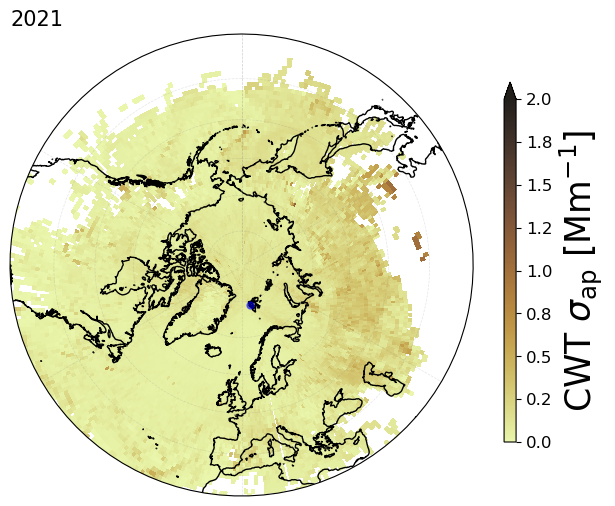

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2021.png


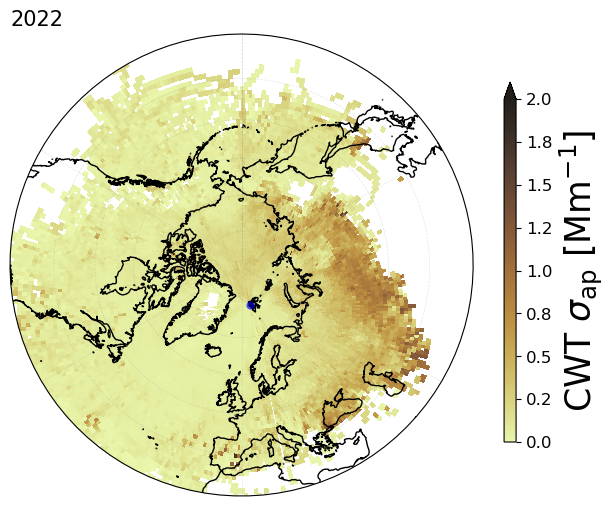

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2022.png


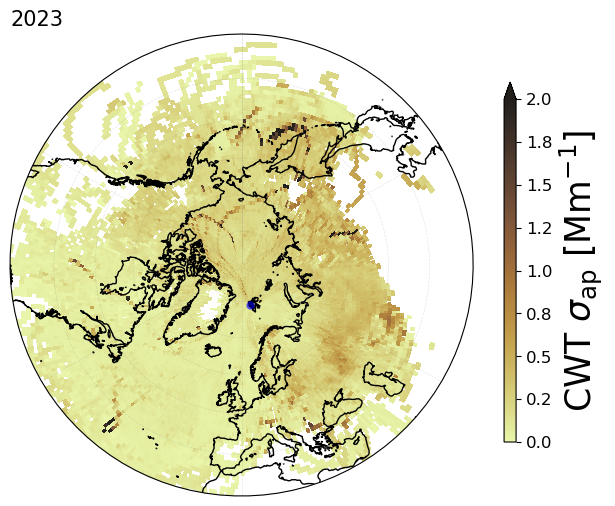

['C:\\Users\\DominicHeslinRees\\Pictures\\black_carbon\\final_plots']
make folder
saved as: C:\Users\DominicHeslinRees\Pictures\black_carbon\final_plots\\CWT_2023.png


In [15]:
for i, year in enumerate(years):
    fig = HYplot.circular_plots_array(year_arrays_CWT[i], vmax=2, cmap=cmocean.cm.turbid, 
                   orientation='vertical', colourbar_label=r"CWT $\sigma_{\mathrm{ap}}$ [Mm$^{-1}$]", 
                   colourbar_labelsize=25, colourbar_tick_fontsize=12, decimal_places_colourbar=1,
                   scientific_notation=False, axes_projection='North_Stereo', 
                   array_projection='rotated_pole', title=str(year))
    HYplot.save_plot(fig, name='CWT_'+str(year), formate='.png', dpi=300,)

## Animated plot: 

In [26]:
years = np.arange(2002, 2024, 1)
North_Stereo = ccrs.NorthPolarStereo() 
fig, ax = HYplot.sp_map(1, projection=North_Stereo, figsize=(6,6)) 
def animate(i):
    ax.cla()
    HYplot.circular_subplots(year_arrays_CWT[i], vmax=2, vmin=0, cmap=cmocean.cm.turbid,
                      orientation='vertical', colourbar_label=r"CWT $\sigma_{\mathrm{ap}}$ [Mm$^{-1}$]",
                      colourbar_labelsize=20,  
                      colourbar_tick_fontsize=12, 
                      scientific_notation=True, decimal_places_colourbar=0, 
                      array_projection='rotated_pole', title=str(years[i]), ZEP_lat=78.906,ZEP_lon=11.888, 
                      central_longitude=0, 
                      show_colourbar=False, extend=None,
                      cb_pos_x=.95, cb_width=0.02, lat_min=30, df_cluster=None, colour_mean='k',
                      ax=ax, fig=None)    
anim = animation.FuncAnimation(fig, animate, frames = len(years), interval=1, blit=False)
anim.save("abs_trend.gif", dpi=300, writer=PillowWriter(fps=1))

## Single year: 

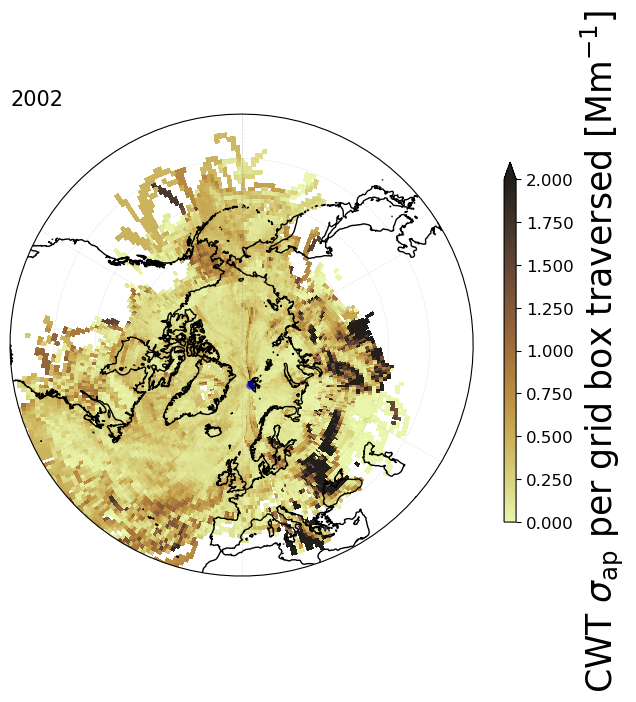

In [7]:
fig = HYplot.circular_plots_array(year_arrays_CWT[0], vmax=2, cmap=cmocean.cm.turbid, 
               orientation='vertical', colourbar_label=r"CWT $\sigma_{\mathrm{ap}}$ per grid box traversed [Mm$^{-1}$]", 
               colourbar_labelsize=25, colourbar_tick_fontsize=12, decimal_places_colourbar=3,
               scientific_notation=False, axes_projection='North_Stereo', array_projection='rotated_pole', title=2002)

## plot years as loop: 

In [ ]:
years = np.arange(2002, 2023, 1)
for i, year in enumerate(years):    
    fig = HYplot.circular_plots_array(year_arrays_CWT[i], vmax=2, cmap=cmocean.cm.turbid, 
                   orientation='vertical', colourbar_label=r"CWT $\sigma_{\mathrm{ap}}$ per grid box traversed [Mm$^{-1}$]", 
                   colourbar_labelsize=25, colourbar_tick_fontsize=12, decimal_places_colourbar=3,
                   scientific_notation=False, axes_projection='North_Stereo', array_projection='rotated_pole', title=str(year))
    #HYplot.save_plot(fig, name='CWT_abs_per_'+str(year))

# Figure S10

# Plot all 22 years: 

num years: 22
num cols: 6
number of rows: 4
use scientific notation:


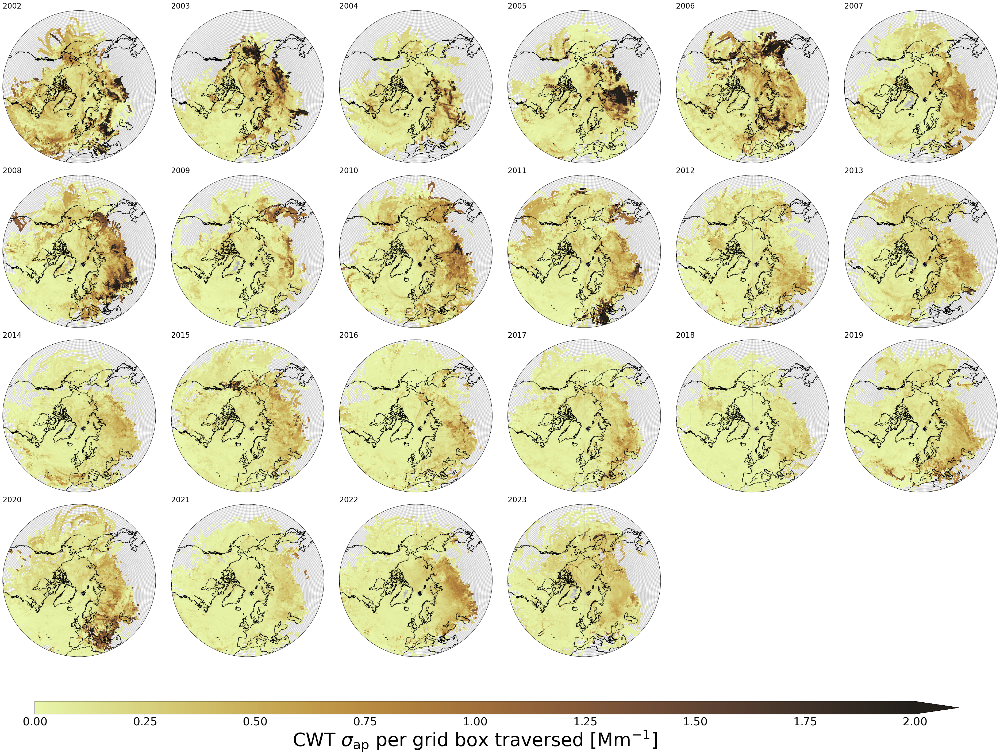

['C:\\Users\\DominicHeslinRees\\Documents\\ACP_2023\\plots']
make folder
saved as: C:\Users\DominicHeslinRees\Documents\ACP_2023\plots\\FigureS10.png


In [8]:
fig = HYplot.array_subplots(year_arrays_CWT, years=np.arange(2002, 2024, 1), nrows=4, vmax=2, start_year=2002,
               colourbar_label=r"CWT $\sigma_{\mathrm{ap}}$ per grid box traversed [Mm$^{-1}$]",
               suptitle='', axes_projection='North_Stereo', cmap=cmocean.cm.turbid, 
               array_projection='rotated_pole', delete_axes=[-2, -1], cb_height=0.015)

HYplot.save_plot(fig, savepath_plot, name='FigureS10', formate='.png', dpi=300)

# Plot all 57 seasons:

In [ ]:
season_to_season_num = HYplot.get_full_season_abb_years(start_year=2002, number_years=21, first_season='AHZ')
years=np.arange(2002, 2023, 1)
df_res_concat = HYplot.append_dfs_residence_times(years, season_to_season_num)

In [11]:
season_arrays_CWT = HYplot.load_append_CWT_array_seasons(path=inpath_processed_hysplit_dfs+"abs\\dfs\\seasons\\")
season_arrays_CWT = {int(key): value for key, value in season_arrays_CWT.items()} #make integers then 
season_arrays_CWT = dict(sorted(season_arrays_CWT.items())) #sort
season_arrays_CWT_list = list(season_arrays_CWT.values())
print(season_arrays_CWT_list)

[]


In [ ]:
fig = HYplot.array_subplots(season_arrays_CWT_list[:], years=np.arange(1, 58, 1), nrows=5, vmax=2, start_year=2002,
               colourbar_label=r"CWT $\sigma_{\mathrm{ap}}$ per grid box traversed [Mm$^{-1}$]",
               suptitle='', axes_projection='North_Stereo', 
               array_projection='rotated_pole', delete_axes=[-3, -2, -1], dict_titles=season_to_season_num)